# Исследование рынка заведений общественного питания Москвы

## Открытие данных

In [1]:
# импортируем необходимые библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import json
from folium import Map, Choropleth, Marker

In [2]:
# отобразим первые пять строк датасета
data = pd.read_csv('/datasets/moscow_places.csv')
display(data.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
# рассмотрим информацию о датасете
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Датасет содержит 8406 строк и 14 столбцов. Наблюдаются пропуски и несоответствующие типы данных в некоторых столбцах. Данные нуждаются в предобработке.

## Предобработка данных

### Изменение типов данных


Для дальнейшего анализа поменяем типы данных в столбцах "chain" (на bool, т.к. значения столбца содержат только True или False) и "seats" (на int, т.к. количество посадочных мест не может быть дробным значением).

In [4]:
data['chain'] = data['chain'].astype('bool')
data['seats'] = data['seats'].astype('Int64')

data.info() # проверяем типы данных после обработки

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   bool   
 13  seats              4795 non-null   Int64  
dtypes: Int64(1), bool(1), float64(5), object(7)
memory usage: 870.3+ KB


### Поиск дубликатов

Рассмотрим наличие абсолютных и неявных дубликатов в датасете

In [5]:
# приведем все наименования кафе к нижнему регистру для исключения части неявных дубликатов
data['name'] = data['name'].str.lower() 

In [6]:
data.duplicated().sum() # посчитаем абсолютных явных дубликатов

0

Абсолютных дубликатов в датасете нет. Необходимо рассмотреть наличие неявных дубликатов и дубликатов в столбце с наименованием заведений.

In [7]:
data['name'].duplicated().sum() # посчитаем количество одинаковых  названий заведений

2894

В датасете большое количество одинаковых названий, однако это может быть связано с тем, что в данных содержатся сведения о сетевых заведениях. Необходимо подробнее рассмотреть причины появления дубликатов в столбце с названиями.

In [8]:
# рассмотрим дубликаты в названиях заведений, не являющихся сетевыми
data[(data['name'].duplicated()) & (data['chain'] != 1)].head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
47,кафе,кафе,"Москва, улица Маршала Федоренко, 7",Северный административный округ,"ежедневно, 11:00–00:00",55.880306,37.489760,2.8,NaN,NaN,NaN,NaN,False,35
108,кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.908930,37.558777,4.2,NaN,NaN,NaN,NaN,False,<NA>
123,кафе,кафе,"Москва, Шенкурский проезд, 14",Северо-Восточный административный округ,NaN,55.897794,37.591395,4.3,NaN,NaN,NaN,NaN,False,50
141,кафе,кафе,"Москва, Дубнинская улица, 52, стр. 1",Северный административный округ,"ежедневно, 10:00–20:00",55.896020,37.556072,3.9,NaN,NaN,NaN,NaN,False,70
159,кафе,кафе,"Москва, Дмитровское шоссе, 163А",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.908830,37.538790,4.0,NaN,NaN,NaN,NaN,False,<NA>
183,кафе,кафе,"Москва, Алтуфьевское шоссе, 106",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.907607,37.588674,3.2,NaN,NaN,NaN,NaN,False,6
189,кафе,кафе,"Москва, парк Ангарские Пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,False,<NA>
190,кафе,кафе,"Москва, Алтуфьевское шоссе, 52А",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.878216,37.588239,4.5,NaN,NaN,NaN,NaN,False,<NA>
192,шаурма,кафе,"Москва, Вагоноремонтная улица, 5, корп. 3",Северный административный округ,"ежедневно, 08:00–23:00",55.896548,37.539999,4.1,NaN,NaN,NaN,NaN,False,<NA>
209,кафе,кофейня,"Москва, Алтуфьевское шоссе, 52",Северо-Восточный административный округ,пн-сб 09:00–20:00; вс 09:00–18:00,55.878024,37.587597,4.5,NaN,NaN,NaN,NaN,False,18


In [9]:
# Посчитаем количество одинаковых названий у не сетевых заведений
data[(data['name'].duplicated()) & (data['chain'] != 1)]['name'].count()

422

!В данных наблюдается большое число заведений, для которых не указано реальное название. Это может быть связано с тем, что данные вносятся в том числе самими пользователями, которые могли указать не наименование заведения, а просто его категорию.

*В дальнейшем при заполнении данной таблицы рекомендуется обработать данные строки, заменив названия на реальные, а также проверять вносимые новые значения.

In [10]:
# проверим уникальные наименования заведений на наличие неявных дубликатов
sorted(set(data['name']))

['#кешбэккафе',
 '+39 pizzeria mozzarella bar',
 '1 этаж',
 '1-я креветочная',
 '10 идеальных пицц',
 '1001 ночь',
 '100ловая',
 '100лоффка',
 '13',
 '13 chef doner',
 '15 kitchen+bar',
 '15-й шар',
 '16 июня',
 '16 тонн',
 '18 грамм',
 '1901 comfort food zone',
 '1у',
 '2 типа',
 '2-й этаж',
 '2046',
 '21 век',
 '22 акра кофе&хлеб',
 '2u-ту-ю',
 '3 ступени',
 '351 bar',
 '4 сезона',
 '4.2. bar',
 '4/1 restaurant',
 '42 coffee shop',
 '47',
 '495',
 '4friends coffee',
 '4tuna cafe&grill',
 '5 stars coffee',
 '55.709201, 37.392257',
 '6 am bread kitchen',
 '6 рукопожатий',
 '69 раков',
 '7 сэндвичей',
 '7 элемент',
 '7/12',
 '8 oz',
 '8 вафель',
 '8 зёрен',
 '8 пончиков',
 '800°с contemporary steak',
 '8bit pizza',
 '9 bar coffe',
 '9 bar coffee',
 '9 зёрен',
 'a-cafe',
 'abc coffee roasters',
 'acai family',
 'accent',
 "adam's chicken",
 'adria mare',
 'ahava',
 'air coffee',
 'al halal',
 'al33 пиццерия бар боттега',
 'all day',
 'alma',
 'alternative coffee',
 'aly’s poke',
 'amande

В датасете наблюдается огромное число уникальных наименований, однако можно сразу заметить схожие названия 9 bar coffe и 9 bar coffee. Рассмотрим эти значения в качестве примера.

In [11]:
# отобразим строки в которых встречаются оба названия
data[(data['name'] == '9 bar coffe') | (data['name'] == '9 bar coffee')]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
45,9 bar coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,True,46
782,9 bar coffe,кофейня,"Москва, Алтуфьевское шоссе, 43",Северо-Восточный административный округ,пн-пт 07:30–18:00,55.870479,37.580795,4.4,NaN,NaN,NaN,NaN,False,<NA>
1446,9 bar coffee,кофейня,"Москва, Ленинградский проспект, 80, корп. 1",Северный административный округ,"пн-пт 07:30–21:00; сб,вс 07:30–19:00",55.810352,37.506625,4.3,NaN,Цена чашки капучино:60–150 ₽,NaN,105.0,True,625
2323,9 bar coffee,кофейня,"Москва, Стромынский переулок, 4",Восточный административный округ,"пн-пт 08:00–20:00; сб,вс 08:00–18:00",55.793241,37.694106,4.3,NaN,Цена чашки капучино:130–230 ₽,NaN,180.0,True,0
4013,9 bar coffee,кофейня,"Москва, Бережковская набережная, 16А",Западный административный округ,пн-пт 09:00–19:00,55.737824,37.562717,4.4,NaN,Цена чашки капучино:115–140 ₽,NaN,127.0,True,<NA>
5181,9 bar coffee,кофейня,"Москва, Космодамианская набережная, 52с1",Центральный административный округ,пн-пт 08:00–20:00,55.732185,37.646987,4.2,NaN,NaN,NaN,NaN,True,<NA>
5450,9 bar coffee,кофейня,"Москва, Боровая улица, 10к1",Юго-Восточный административный округ,"ежедневно, 08:00–22:00",55.771561,37.713906,4.6,NaN,NaN,NaN,NaN,True,<NA>
5572,9 bar coffee,кофейня,"Москва, Боровая улица, 7, стр. 2",Юго-Восточный административный округ,пн-пт 08:00–18:30,55.771149,37.714980,4.1,NaN,NaN,NaN,NaN,True,10


Можно заметить, что все заведения с наименованием 9 bar coffee являются сетевыми, в отличие от кофейни 9 bar coffe. Можно предположить, что произошла ошибка при внесении данных. Поменяем наименование кофейни и "включим" ее в сеть данных кофеен.

In [12]:
data.loc[782, 'chain'] = True
data.loc[782, 'name'] = '9 bar coffee'

### Обработка пропусков


Рассмотрим и обработаем пропуски в данных, где это возможно.

In [13]:
data.isna().sum() # посчитаем количество пропусков в данных

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Пропуски наблюдаются в 6 столбцах, причем в столбцах "middle_avg_bill" и "middle_coffee_cup" они связаны с тем, что данные в этих столбцах указываются только если, в столбце "avg_bill" есть необходимая информация (указан размер среднего чека или стоимость одной сашки кофе), оставим их в изначальном виде. Пропуски в столбцах "hours", "price", "avg_bill" и "seats" невозможно заполнить логически какими-либо конкретными значениями, соответственно заполним пропуски в столбцах "hours", "price", "avg_bill" на "неизвестно", а столбец "seats" оставим в изначальном виде, так как он будет нужен для дальнейших расчетов.

In [14]:
data['hours'] = data['hours'].fillna('неизвестно')
data['price'] = data['price'].fillna('неизвестно')
data['avg_bill'] = data['avg_bill'].fillna('неизвестно')

data.isna().sum() # посчитаем количество пропусков после обработки

name                    0
category                0
address                 0
district                0
hours                   0
lat                     0
lng                     0
rating                  0
price                   0
avg_bill                0
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

###  Создание новых столбцов в таблице


Добавим в таблицу новые столбцы:
* street с названиями улиц из столбца с адресом
* is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
         - логическое значение True — если заведение работает ежедневно и круглосуточно;
         - логическое значение False — в противоположном случае.

In [15]:
# создадим функцию, вычленяющую название улицы из столбца с адресом
def func(data):
    try:
        return data.split(',')[1]
    except:
        return 'ошибка'

data['street'] = data['address'].apply(func) # добавим новый столбец, используя полученную функцию
data['street'] = data['street'].str.lstrip()

data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,неизвестно,неизвестно,NaN,NaN,False,<NA>,улица Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4,улица Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45,Клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,неизвестно,Цена чашки капучино:155–185 ₽,NaN,170.0,False,<NA>,улица Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148,Правобережная улица


In [16]:
# напишем функцию, определяющую работает ли заведение 24/7
def func_24(data):
    try:
        if ('ежедневно' in data) and ('круглосуточно' in data):
            return True
        return False
    except:
        return 'ошибка'

data['is_24_7'] = data['hours'].apply(func_24) #применим полученную функцию к столбцу с часами работы

data.head(20)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,неизвестно,неизвестно,NaN,NaN,False,<NA>,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,неизвестно,Цена чашки капучино:155–185 ₽,NaN,170.0,False,<NA>,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148,Правобережная улица,False
5,sergio pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,неизвестно,NaN,NaN,False,<NA>,Ижорская улица,False
6,огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,False,45,Клязьминская улица,False
7,mr. уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,False,45,Клязьминская улица,False
8,donna maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,False,79,Дмитровское шоссе,False
9,готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,False,65,Ангарская улица,False


In [17]:
data[(data['is_24_7'] == 'ошибка') | (data['street'] == 'ошибка')] #проверим есть ли ошибки

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7


## Анализ данных

###  Исследование категорий заведений


Рассмотрим категории заведений, представленные в данных, и количество заведений в каждой категории.

In [18]:
# рассмотрим количество заведений в каждой представленной категории
data_category = data.groupby('category',as_index=False)['name'].count().sort_values('name', ascending=False)

data_category

,category,name
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


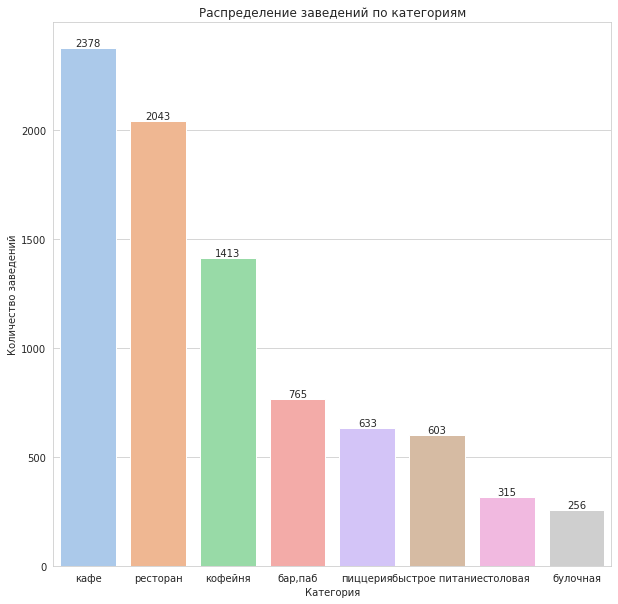

In [19]:
# построим столбчатую диаграмму распределения заведений по категориям
sns.set_style('whitegrid')
sns.set_palette('pastel')
plt.figure(figsize=(10, 10))


sns.barplot(x='category', y='name', data=data_category)

for index, value in enumerate(data_category['name']):
    plt.text(index, value, str(value), ha='center', va='bottom')
    
plt.title('Распределение заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')

plt.show()

По полученным данным можно сказать, что в Москве преобладают кафе, рестораны и кофейни. Кроме того наблюдается большой разрыв между топ-3 с остальными категориями. В трех преобладающих категориях разрыв в числе заведений также достаточно большой.

### Количество посадочных мест по категориям


Рассмотрим как распределяется число посадочных мест в зависимости от категории заведения. Для сравнения воспользуемся медианным значением, так как оно меньше подвержено влиянию выбросов. 

In [20]:
# сформируем сводную таблицу, содержащую медианные значения количества посадочных мест в разрезе категорий
data_seats = data.pivot_table(index='category', values='seats', aggfunc='median').sort_values('seats',ascending=False)

data_seats

,seats
category,
ресторан,86.0
"бар,паб",82.5
кофейня,80.0
столовая,75.5
быстрое питание,65.0
кафе,60.0
пиццерия,55.0
булочная,50.0


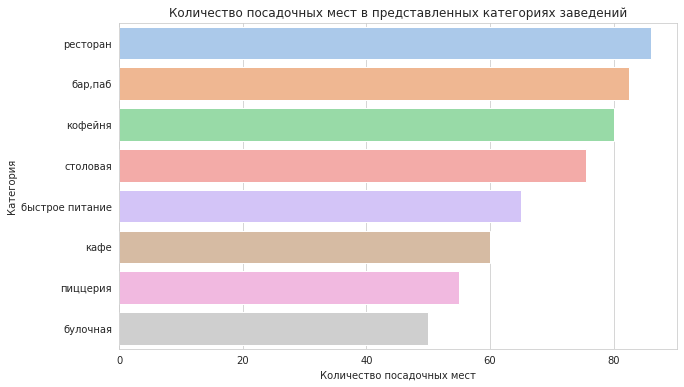

In [21]:
# построим столбчатую диаграмму для визуалзации полученных данных
plt.figure(figsize=(10, 6))
plt.rc('axes', titlesize=12)


plot = sns.barplot(y=data_seats.index, x='seats', data=data_seats);
   
plt.title('Количество посадочных мест в представленных категориях заведений')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категория')


plt.show()

Наибольшее медианное количество посадочных мест наблюдается в заведения с категориями: ресторан, бар и кофейня. Количество мест в данных заведениях превышает 80. Наименьшее медианное значение можно увидеть в булочных, пиццериях и кафе.

### Исследование сетевых и несетевых заведений

Рассмотрим заведения общественного питания в разрезе принадлежности к сетям.

В первую очередь, посчитаем количество сетевых и несетевых заведений.

In [22]:
#сформируем сводную таблицу, в которой данные сгруппированы по признаку принадлежности к сетям, и посчитаем кол-во заведений
data_chain = data.pivot_table(index='chain', values='name', aggfunc='count')

data_chain

,name
chain,
False,5200
True,3206


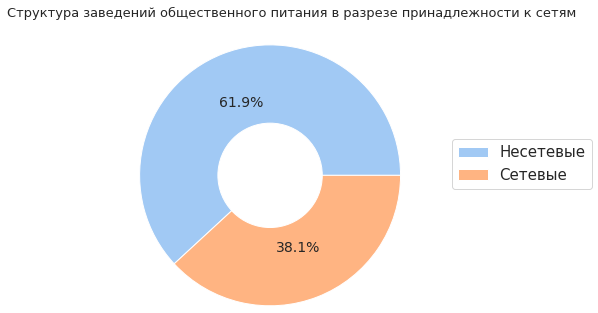

In [23]:
# построим диаграмму-пончик для визуализации полученных данных
plt.rc('axes', titlesize=13)
fig, ax = plt.subplots()
ax.pie(data=data_chain, x='name', autopct='%1.1f%%',textprops={'fontsize': 14}, radius=1.5);

centre_circle = plt.Circle((0,0),0.60,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

label=['Несетевые', 'Сетевые']
plt.legend(label, bbox_to_anchor=(1.3, 0.7), prop={'size': 15})
plt.title('Структура заведений общественного питания в разрезе принадлежности к сетям',x=0.6, y=1.2)

plt.show()

По полученным данным можно сделать вывод, что в Москве преобладают заведения, не являющиеся частью какой-либо сети - таких заведений около 60%.



Теперь необходимо рассмотреть распределение сетевых и несетевых заведений в разрезе категорий.

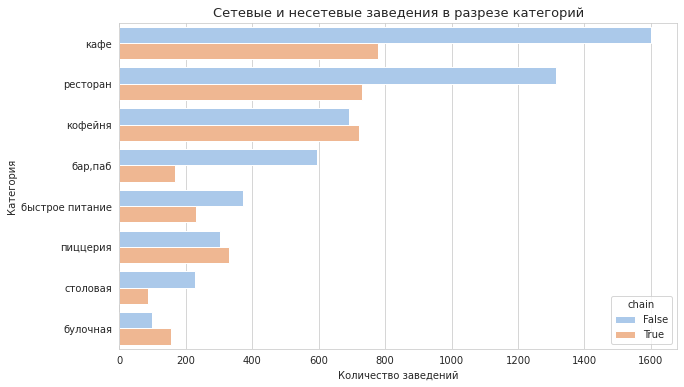

In [24]:
# сгруппируем заведения по двум признакам: категория заведения и отношение к сетям
# посчитаем кол-во заведений в каждой категории и отсортируем их по убыванию
data_cat_ch = data.groupby(['category', 'chain'], \
                        as_index = False)[['name']].count().sort_values('name', ascending=False)

#построим столбчатую диаграмму по полученным данным
plt.figure(figsize=(10, 6))

sns.barplot(y='category', x='name', data=data_cat_ch, hue='chain');

plt.title('Сетевые и несетевые заведения в разрезе категорий')
plt.xlabel('Количество заведений')
plt.ylabel('Категория')

plt.show()

На графике видно, что большая часть как сетевых, так и несетевых заведений относятся к категории "кафе". Лидерами так же являются категории "ресторан" и "кофейня". Кроме того, число несетевых заведений превышает число сетевых практически по всем категориям кроме кофеен, пиццерий и булочных.

In [25]:
data_cat_ch1 = data.pivot_table(index='category', columns='chain', values='name', aggfunc='count')
data_cat_ch1.columns = ['not_chain', 'chain']
data_cat_ch1['share_ch'] = round(data_cat_ch1['chain'] / (data_cat_ch1['not_chain'] + data_cat_ch1['chain']), 2)
data_cat_ch1 = data_cat_ch1.sort_values('share_ch', ascending=False)

data_cat_ch1

,not_chain,chain,share_ch
category,,,
булочная,99,157,0.61
пиццерия,303,330,0.52
кофейня,692,721,0.51
быстрое питание,371,232,0.38
ресторан,1313,730,0.36
кафе,1599,779,0.33
столовая,227,88,0.28
"бар,паб",596,169,0.22


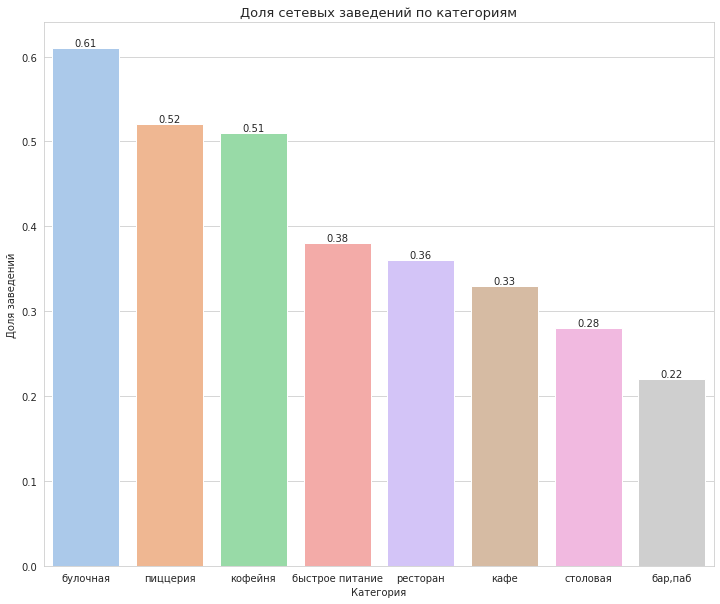

In [26]:
# построим столбчатую диаграмму распределения заведений по категориям
sns.set_style('whitegrid')
sns.set_palette('pastel')
plt.figure(figsize=(12, 10))


sns.barplot(x=data_cat_ch1.index, y='share_ch', data=data_cat_ch1)

for index, value in enumerate(data_cat_ch1['share_ch']):
    plt.text(index, value, str(value), ha='center', va='bottom')
    
plt.title('Доля сетевых заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Доля заведений')

plt.show()

Наибольшая доля сетевых заведений общепита в общем числе заведений наблюдается в категории "булочная" - более 60%. В топ-3 также вошли пиццерии и кафейни - более 50%

### Популярные сети в регионе

Исследуем топ-15 самых популярных заведений в Москве. Для этого сгруппируем заведения по наименованию и посчитаем их количество, отсортируем полученные данные по убыванию и отразим первые 15 заведений. 

In [27]:
#группируем данные по наименованию заведений
data_popular = data.groupby('name', as_index=False)['category'].count()
data_popular.sort_values('category', ascending=False).head(15)

,name,category
2824,кафе,189
5417,шоколадница,120
2531,домино'с пицца,77
2499,додо пицца,74
1136,one price coffee,72
5490,яндекс лавка,69
412,cofix,65
1262,prime,50
4992,хинкальная,44
5318,шаурма,43


В полученной таблице можно увидеть несколько наименований, которые не являются реальными названиями заведений: кафе, хинкальная, шаурма, чайхана, ресторан, столовая. Исключим данные наименования для того, чтобы они не искажали выводы, сделвнные по полученной таблице.

In [28]:
# исключим наименования, искажающие данные из группировки
# дополним таблицу категориями заведений
data_popular = data.query('name != ["кафе", "хинкальная", "шаурма", "ресторан", "столовая", "чайхана"]').pivot_table(index='name', values='category', aggfunc=['count','first'])
data_popular.columns = ['count', 'category']
dt = data_popular.sort_values('count', ascending=False).head(15)

dt

,count,category
name,,
шоколадница,120,кофейня
домино'с пицца,77,пиццерия
додо пицца,74,пиццерия
one price coffee,72,кофейня
яндекс лавка,69,ресторан
cofix,65,кофейня
prime,50,ресторан
кофепорт,42,кофейня
кулинарная лавка братьев караваевых,39,кафе


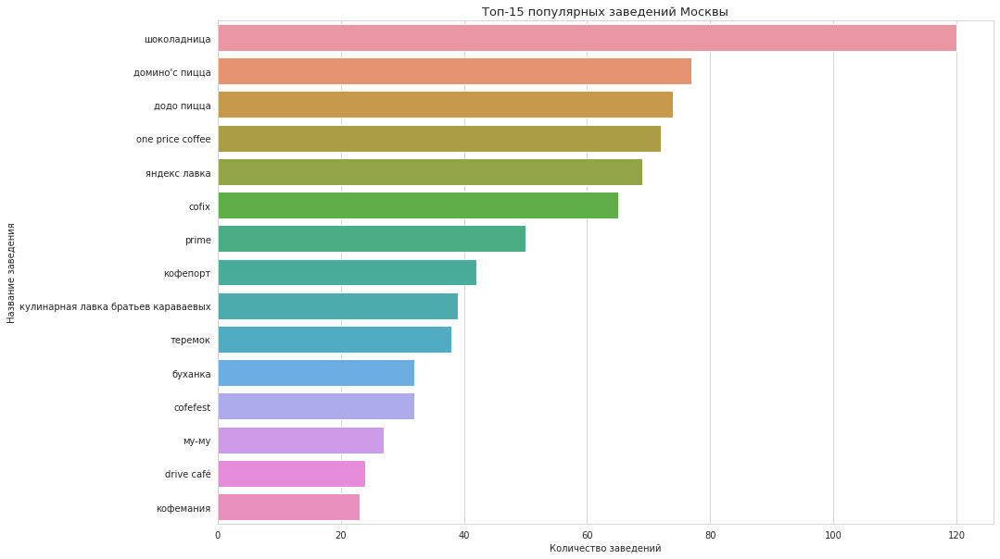

In [29]:
# построим столбчатую диаграмму по полученным данным
plt.figure(figsize=(15, 10))
sns.barplot(y=dt.index, x='count', data=dt);

plt.title('Топ-15 популярных заведений Москвы')
plt.xlabel('Количество заведений')
plt.ylabel('Название заведения')

plt.show()

Абсолютным лидером по количеству заведений в Москве является шоколадница - 120 заведений. Кроме того наблюдается достаточно большой отрыв лидера от следующих в топе заведений - доминос пиццы и додо пиццы (более чем на 40 заведений).

Также нужно заметить, что почти половина заведений, представленных в топе, являются кофейнями.

### Распределение заведений по районам Москвы!

Рассмотрим распределение заведений общественного питания по районам Москвы. Для этого посчитаем количество заведений всех категорий в целом для каждого района, а также число заведений в разрезе категорий.

In [30]:
# сгруппируем данные по районам Москвы и посчитаем количество заведений в каждом районе
data_dis1 = data.groupby('district', as_index=False)['name'].count()

data_dis1

,district,name
0,Восточный административный округ,798
1,Западный административный округ,851
2,Северный административный округ,900
3,Северо-Восточный административный округ,891
4,Северо-Западный административный округ,409
5,Центральный административный округ,2242
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Южный административный округ,892


In [31]:
# сформируем сводную таблицу по данным в разрезе категорий заведений и районов Москвы
data_dis2 = data.pivot_table(index='district', columns='category', values='name', aggfunc='count').reset_index()
data_dis2

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Восточный административный округ,53,25,71,272,105,72,160,40
1,Западный административный округ,50,37,62,239,150,71,218,24
2,Северный административный округ,68,39,58,235,193,77,189,41
3,Северо-Восточный административный округ,63,28,82,269,159,68,182,40
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18
5,Центральный административный округ,364,50,87,464,428,113,670,66
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17
8,Южный административный округ,68,25,85,264,131,73,202,44


In [32]:
# объединим полученные таблицы в одну для удобства анализа
data_district = data_dis1.merge(data_dis2, on='district', how='left').sort_values('name')

data_district

,district,name,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
4,Северо-Западный административный округ,409,23,12,30,115,62,40,109,18
7,Юго-Западный административный округ,709,38,27,61,238,96,64,168,17
6,Юго-Восточный административный округ,714,38,13,67,282,89,55,145,25
0,Восточный административный округ,798,53,25,71,272,105,72,160,40
1,Западный административный округ,851,50,37,62,239,150,71,218,24
3,Северо-Восточный административный округ,891,63,28,82,269,159,68,182,40
8,Южный административный округ,892,68,25,85,264,131,73,202,44
2,Северный административный округ,900,68,39,58,235,193,77,189,41
5,Центральный административный округ,2242,364,50,87,464,428,113,670,66


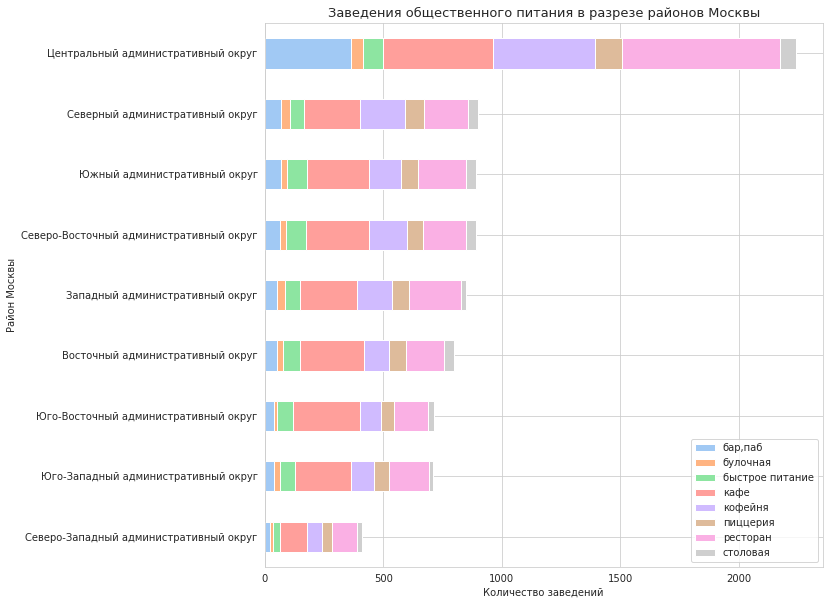

In [33]:
# построим график по полученным данным
data_district.iloc[:,[0, 2, 3, 4, 5, 6, 7, 8, 9]].plot( 
    x = 'district', 
    kind = 'barh', 
    stacked = True, 
    title = 'Заведения общественного питания в разрезе районов Москвы', 
    figsize=(10,10));

plt.xlabel('Количество заведений')
plt.ylabel('Район Москвы')

plt.show()

В датасете представлены 9 районов Москвы: Центральный административный округ, Северный административный округ, Южный административный округ, Северо-Восточный административный округ, Западный административный округ, Восточный административный округ, Юго-Восточный административный округ, Юго-Западный административный округ и Северо-Западный административный округ.

Лидером по количеству заведений в целом и в каждой категории является Центральный административный округ. Можно заметить, что отрыв между лидером и отсальными районам достаточно большой - заведений в Центральном АО более чем в 2 раза больше, чем в Северном АО.

### Средние рейтинги заведений общественного питания Москвы

Рассмотрим средние рейтинги заведений в Москве по категориям, их различия в зависимости от категорий, а также построим хороплет со средним рейтингом заведений каждого района.

In [34]:
# сформируем сводную таблицу со средними рейтингами заведений в разрезе категорий
data_rating = data.pivot_table(index='category', values='rating', aggfunc='mean').sort_values('rating', ascending=False)
data_rating['rating'] = round(data_rating['rating'], 2)

data_rating

,rating
category,
"бар,паб",4.39
пиццерия,4.30
ресторан,4.29
кофейня,4.28
булочная,4.27
столовая,4.21
кафе,4.12
быстрое питание,4.05


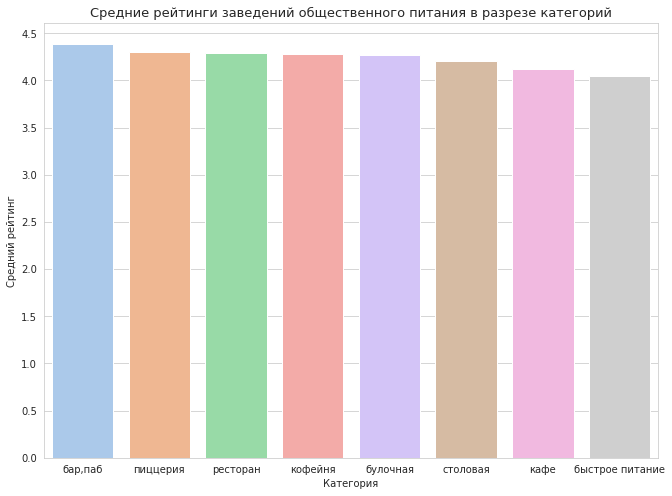

In [35]:
# построим столбчатую диаграмму со средними рейтингами
plt.figure(figsize=(11, 8))

sns.barplot(x=data_rating.index, y='rating', data=data_rating);
plt.yticks(np.arange(0, 5, 0.5));

plt.title('Средние рейтинги заведений общественного питания в разрезе категорий')
plt.xlabel('Категория')
plt.ylabel('Средний рейтинг')

plt.show()

Можно заметить, что усредненные рейтинги заведений общественного питания Москвы в разрезе категорий не сильно различаются и находятся в диапазоне 4.0-4.4.

In [36]:
data_rating_d = data.groupby('district', as_index=False)['rating'].agg('mean')
data_rating['rating'] = round(data_rating['rating'], 2)

data_rating_d

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239778
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [37]:
# построим фоновую картограмму со средними рейтингами заведений каждого районаии
#admin_level_geomap.geojson
state_geo = '/datasets/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=data_rating_d,
    columns=['district','rating'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.7,
    legend_name=' Средний рейтинг заведений общепита по районам Москвы'
).add_to(m)

m

В соответствии с хороплетом можно сказать, что самый высокий средний рейтинг заведений наблюдается в Центральном АО - в диапазоне от 4.33 до 4.38, а самый низкий в Юго-Восточном АО - от 4.10 до 4.15. В целом рейтинги отличаются незначительно, о чем говорят одинаковые цвета районов на хороплете и шкала (от 4.10 до 4.38). 

### Карта заведений общественного питания Москвы


Построим карту Москвы, на который будут отображены все заведения, представленные в датасете, в виде кластеров.

In [38]:
from folium.plugins import MarkerCluster
moscow_lat, moscow_lng = 55.751244, 37.618423
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

marker_cluster = MarkerCluster().add_to(m1)

def cluster(row):
    Marker(
         [row['lat'], row['lng']],
         popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    
data.apply(cluster, axis=1)
m1

### Распределение заведений по улицам Москвы

Составим топ-15 улиц с самым большим числом заведений общественного питания. Рассмотрим количество заведений на этих улицах в разрезе категорий.

In [39]:
# сгруппируем данные по улицам, представленным в датасете, посчитаем общее количество заведений на этих улицах
data_str1 = data.groupby('street', as_index=False)['name'].count()

#сформируем сводную таблицу с данными в разрезе улиц и категорий заведений
data_str2 = data.pivot_table(index='street', columns='category', values='name', aggfunc='count').reset_index()
#поменяем тип данных в таблице
data_str2.iloc[:, 1:9] = data_str2.iloc[:, 1:9].astype('Int64')

#объединим полученные таблицы в одну
data_street = data_str1.merge(data_str2, on='street', how='left').sort_values('name', ascending=False)


data_street.head(15)

,street,name,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
1090,проспект Мира,184,12,4,21,53,36,11,45,2
773,Профсоюзная улица,122,6,4,15,35,18,15,26,3
1087,проспект Вернадского,108,7,1,12,25,16,12,33,2
525,Ленинский проспект,107,10,3,2,26,23,5,33,5
523,Ленинградский проспект,95,15,4,2,12,25,9,25,3
373,Дмитровское шоссе,88,6,2,10,23,11,8,24,4
455,Каширское шоссе,77,2,<NA>,10,20,16,5,19,5
298,Варшавское шоссе,76,6,<NA>,7,18,14,4,20,7
524,Ленинградское шоссе,70,5,2,5,13,13,3,26,3
550,МКАД,65,1,<NA>,9,45,4,<NA>,5,1


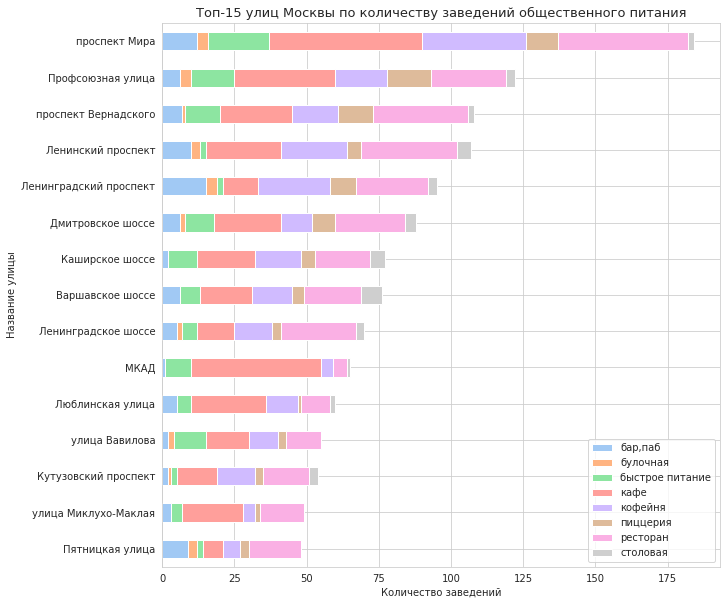

In [40]:
# построим график по полученным данным
(data_street.head(15).sort_values('name')
            .iloc[:,[0, 2, 3, 4, 5, 6, 7, 8, 9]]
            .plot( 
                   x = 'street', 
                   kind = 'barh', 
                   stacked = True, 
                   title = 'Топ-15 улиц Москвы по количеству заведений общественного питания', 
                   figsize=(10,10))
);

plt.xlabel('Количество заведений')
plt.ylabel('Название улицы')

plt.show()

Самое большое число заведений общественного питания наблюдается на проспекте Мира - более 180 заведений. Меньше всего заведений в рамках топ-15 на Пятницкой улице - менее 50 заведений.




Рассмотрим также улицы, на которых находится всего одно заведение общественного питания.

In [41]:
# посчитаем количество улиц с одним заведением общепита
data_street.loc[data_street['name'] == 1]['name'].count()

458

В датасете наблюдается 458 улиц с одним заведением общепита.

In [42]:
# отобразим на экаране первые 15 улиц с одним заведением общепита
data_street.loc[data_street['name'] == 1].head(15)

,street,name,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
1421,улица Фотиевой,1,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,1
1418,улица Фадеева,1,<NA>,<NA>,<NA>,<NA>,1,<NA>,<NA>,<NA>
1233,улица Кирпичные Выемки,1,<NA>,<NA>,<NA>,1,<NA>,<NA>,<NA>,<NA>
1092,сад Эрмитаж,1,<NA>,<NA>,1,<NA>,<NA>,<NA>,<NA>,<NA>
1220,улица Ивана Франко,1,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,1,<NA>
1226,улица Капотня,1,<NA>,<NA>,1,<NA>,<NA>,<NA>,<NA>,<NA>
1439,улица Шухова,1,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,1,<NA>
1222,улица Ильинка,1,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,1,<NA>
1442,улица Юннатов,1,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,1
1114,улица Академика Комарова,1,<NA>,<NA>,<NA>,1,<NA>,<NA>,<NA>,<NA>


По полученным данным можно сделать вывод, что единственные заведения на улицах Москвы представлены различными категориями, какой-либо закономерности не наблюдается.

### Средний размер чека в разрезе районов Москвы

Изучим средний размер чеков в различных районах Москвы. Используем медианные значения средних чеков в разрезе районов, так как они менее подвержены влиянию выбросов.

In [43]:
# сгруппируем данные по районам, посчитаем медианные значения средних чеков
data_mprice = data.groupby('district', as_index=False)['middle_avg_bill'].median()

data_mprice

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [44]:
# построим хороплет с медианными значениями средних чеков в разрезе районов
state_geo = '/datasets/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=data_mprice,
    columns=['district','middle_avg_bill'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.7,
    legend_name='Медианный средний размер чека по районам Москвы'
).add_to(m2)

m2

Можно сделать вывод, что лидерами по средним размерам чека являются Центральный и Западный АО - свыше 900 руб. Самые низкие цены наблюдаются в трех районах: Северо-восточном, Юго-восточном и Южном округах - в диапазоне от 450 до 542 руб. Кроме того, можно увидеть, что при отдалении от центра размеры средних чеков уменьшаются.

### Исследование заведений, работающих 24/7

Рассмотрим заведения общественного питания, работающие ежедневно и круглосуточно: в каких районах таких заведений больше и заведения каких категорий чаще работают по графику 24/7.

In [45]:
# сгруппируем данные о заведениях, паботающих 24/7, по районам и посчитаем кол-во таких заведений для каждого района 
data_24 = data.query('is_24_7 == True').groupby('district', as_index=False)['name'].count().sort_values('name', ascending=False)

data_24

,district,name
5,Центральный административный округ,131
0,Восточный административный округ,97
6,Юго-Восточный административный округ,93
3,Северо-Восточный административный округ,75
8,Южный административный округ,75
7,Юго-Западный административный округ,73
1,Западный административный округ,72
2,Северный административный округ,71
4,Северо-Западный административный округ,43


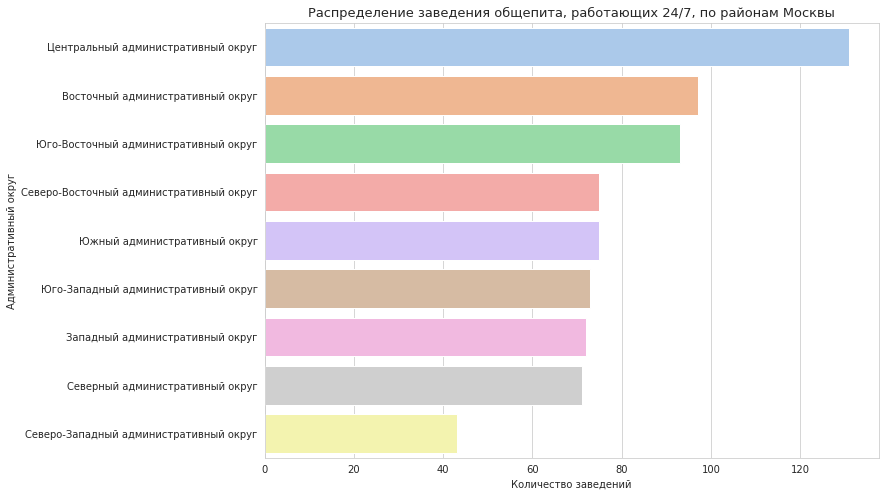

In [46]:
# построим столбчатую диаграмму по полученным данным
plt.figure(figsize=(11, 8))

sns.barplot(y='district', x='name', data=data_24);

plt.title('Распределение заведения общепита, работающих 24/7, по районам Москвы')
plt.xlabel('Количество заведений')
plt.ylabel('Административный округ')

plt.show()

По полученным данным можно сделать вывод, что больше всего заведений общепита, работающих 24/7, наблюдается в центральном АО, а также в восточном и юго-восточном округах.

In [47]:
# сгруппируем заведения, работающие 24/7, по категориям и посчитаем кол-во заведений в каждой категории
data_24_type = data.query('is_24_7 == True').groupby('category', as_index=False)['name'].count().sort_values('name', ascending=False)

data_24_type

,category,name
3,кафе,267
2,быстрое питание,150
6,ресторан,135
4,кофейня,59
0,"бар,паб",52
5,пиццерия,31
1,булочная,24
7,столовая,12


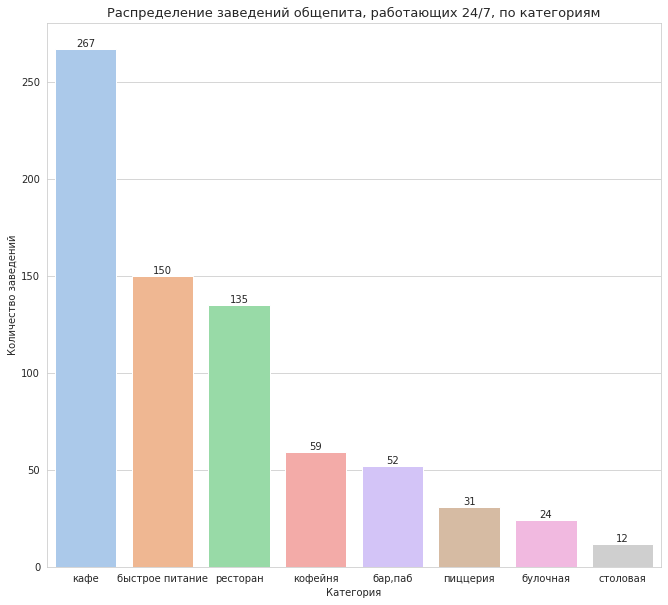

In [48]:
# построим столбчатую диаграмму распределения заведений по категориям
sns.set_style('whitegrid')
sns.set_palette('pastel')
plt.figure(figsize=(11, 10))


sns.barplot(x='category', y='name', data=data_24_type)

for index, value in enumerate(data_24_type['name']):
    plt.text(index, value, str(value), ha='center', va='bottom')
    
plt.title('Распределение заведений общепита, работающих 24/7, по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')

plt.show()

Значительная часть круглосуточных заведений представлены категорией кафе, кроме того можно заметить, что большое кол-во заведений, работающих 24/7, наблюдается в категориях быстрое питание и ресторан. Меньше всего круглосуточных заведений в категории столовая.

### Исследование заведений с низким рейтингом

Рассмотрим заведения общественного питания с низкими рейтингами:
- в каких районах расположены заведения с плохими рейтингами
- категории заведенийй с низкими рейтингами
- средние размеры чеков в таких заведениях\

Для анализа будем считать "низким" рейтинг менее 4.0.

In [49]:
# сгруппируем заведения с рейтингом менее 4 по категориям и посчитаем кол-во заведений в каждой категории
data_br = data.query('rating < 4').groupby('category', as_index=False)['name'].count().sort_values('name', ascending=False)

data_br

,category,name
3,кафе,543
6,ресторан,177
2,быстрое питание,162
4,кофейня,138
7,столовая,44
0,"бар,паб",40
5,пиццерия,35
1,булочная,30


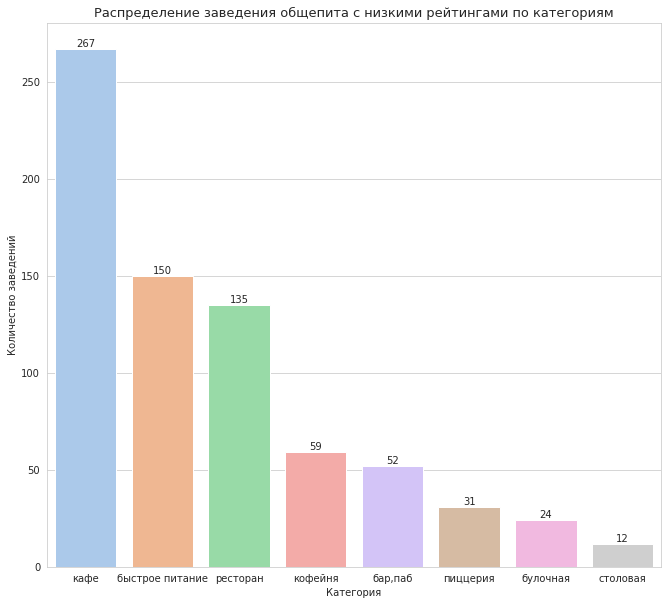

In [50]:
# построим столбчатую диаграмму по полученным данным
sns.set_style('whitegrid')
sns.set_palette('pastel')
plt.figure(figsize=(11, 10))


sns.barplot(x='category', y='name', data=data_24_type)

for index, value in enumerate(data_24_type['name']):
    plt.text(index, value, str(value), ha='center', va='bottom')
    
plt.title('Распределение заведения общепита с низкими рейтингами по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')

plt.show()

На диаграмме можно увидеть, что почти половина заведений с низким ретингом входят в категорию "кафе", это может быть связно в том числе с тем, что в имеющемся датасете в целом представлено больше всего заведений именно в данной категории.

In [51]:
# сгруппируем заведения с рейтингом менее 4 по районам Москвы, посчитаем количество заведений в каждом районе
data_br1 = data.query('rating < 4').groupby('district', as_index=False)['name'].count().sort_values('name', ascending=False)

data_br1

,district,name
6,Юго-Восточный административный округ,170
8,Южный административный округ,155
3,Северо-Восточный административный округ,151
0,Восточный административный округ,148
1,Западный административный округ,141
2,Северный административный округ,123
7,Юго-Западный административный округ,118
5,Центральный административный округ,104
4,Северо-Западный административный округ,59


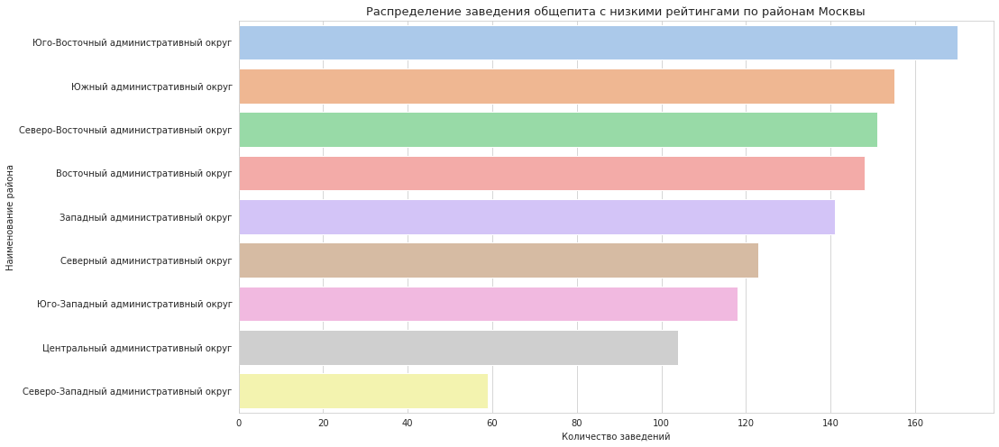

In [52]:
plt.figure(figsize=(15, 8))
sns.barplot(y='district', x='name', data=data_br1);

plt.title('Распределение заведения общепита с низкими рейтингами по районам Москвы')
plt.xlabel('Количество заведений')
plt.ylabel('Наименование района')

plt.show()

In [53]:
# сгруппируем заведения с рейтингом менее 4 по значениям рейтинга, посчитаем кол-во заведений для каждого значения и средний чек
data_br2 = data.query('rating < 4').pivot_table(index='rating', values='middle_avg_bill', aggfunc=['count', 'mean']) 
data_br2.columns = ['count', 'middle_avg_bill']

data_br2 = data_br2.query('count > 0').sort_values('count', ascending=False)
data_br2

,count,middle_avg_bill
rating,,
3.9,52,522.788462
3.8,40,499.250000
3.7,33,469.393939
3.5,22,365.227273
3.6,18,509.722222
3.4,13,498.076923
3.1,10,635.000000
3.3,10,465.500000
3.2,8,696.250000


Можно заметить, что среди заведений с низкими рейтингами, больше всего заведений с рейтингами в диапазоне от 3.7 до 3.9, при этом размер среднего чека в таких организациях относительно не большой - около 500 руб. Кроме того нужно обратить внимание, что самая низкая оценка в имеющихся данных - 1.0, при этом размер среднего чека у данного заведения самый большой - 4500 руб.

### Выводы

Для анализа рынка заведений общественного питания Москвы были использованы данные о заведениях общественного питания Москвы, составленные по данным сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. В исходных данных имелась информация о наименовании заведения, его категории, графике работы, средних ценах, кол-ва посадочных мест, а также его адресс, географические координаты и рейтинг. Полученные данные были предобработаны для дальнейшего анализа, а именно были заполнены или удалены пропуски, значения проверены на наличие дубликатов и добавлены новые столбцы, а именно столбец с названием улицы, на которой расположено заведение, и столбец с обозначением, что заведение работает ежедневно и круглосуточно.


Исходя из полученных в ходе анализа данных, можно сделать следующие выводы:
-	Преобладающими категориями заведений в Москве можно назвать кафе, рестораны и кофейни -28.3%, 24.3% и 16.8% соответственно, т.е. Почти 70% всех представленных в датасете заведений

-	Медианное число посадочных мест варьируется от 50 до 86 мест в зависимости от категории заведения, при этом наибольшее медианное число посадочных мест наблюдается у ресторанов, баров и кофеен

-	Большая часть заведений общественного питания, представленных в датасете, не является сетевыми, таких заведений почти 62%. Кроме того, лидером по числу как сетевых, так и не сетевых заведений является категория “кафе”. Выделить также можно категории “ресторан” и “кофейня”, которые входят в топ-3 по числу сетевых и несетевых заведений.  При этом, в отличие от кафе и ресторанов, в категории “кофейня” преобладают сетевые заведения. Исследование Топ-15 популярных сетевых заведений общепита показало, что почти половина из них представлена кофейнями

-	Представленные в датасете заведения общественного питания неравномерно распределены по 9 административным округам Москвы: лидером по числу заведений с большим отрывом можно назвать Центральный АО, меньше же всего заведений общепита Северо-Западном АО - почти в 5.5 раз меньше, чем в Центральном АО. Средние рейтинги представленных заведений распределяются по районам более равномерно - в диапазоне от 4.10 до 4.38. Самый высокий средний рейтинг заведений наблюдается в Центральном АО - в диапазоне от 4.33 до 4.38, а самый низкий в Юго-Восточном АО - от 4.10 до 4.15. В разрезе категорий усредненные рейтинги также отличаются незначительно и находятся в диапазоне 4.0-4.4

-	Лидерами по средним размерам чека являются Центральный и Западный АО, при отдалении от центра размеры средних чеков уменьшаются, причем в некоторых районах практически в 2 раза

-	В датасете присутствуют заведения, работающие ежедневно и круглосуточно. При этом большая часть таких заведений относится к категориям “кафе”, “быстрое питание” и “ресторан” и находятся в Центральном, Восточном и Юго-Восточном АО

-	Также нужно отметить, что в категориях кафе, ресторан, быстрое питание и кофейня наибольшее количество заведений с рейтингом ниже 4.0, причем в категории кафе почти половина всех заведений с низким рейтингом. Располагаются такие заведения во всех округах, однако больше всего таких заведений в Юго-восточном АО

## Исследование данных о кофейнях

### Количество кофеен в Москве и их распределение по районам

Рассмотрим количество кофеен, представленных в датасете, в целом и в разрезе районов Москвы

In [54]:
# посчитаем число кофеен, представленных в датасете
data.query('category ==  "кофейня"')['name'].count() 

1413

Всего по представленным данным в Москве 1413 кофеен.

In [55]:
# сгруппируем кофейни по районам Москвы и посчитаем их кол-во в каждом районе
data_coffee = data.query('category ==  "кофейня"').groupby('district', as_index=False)['name'].count().sort_values('name', ascending=False)
data_coffee

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


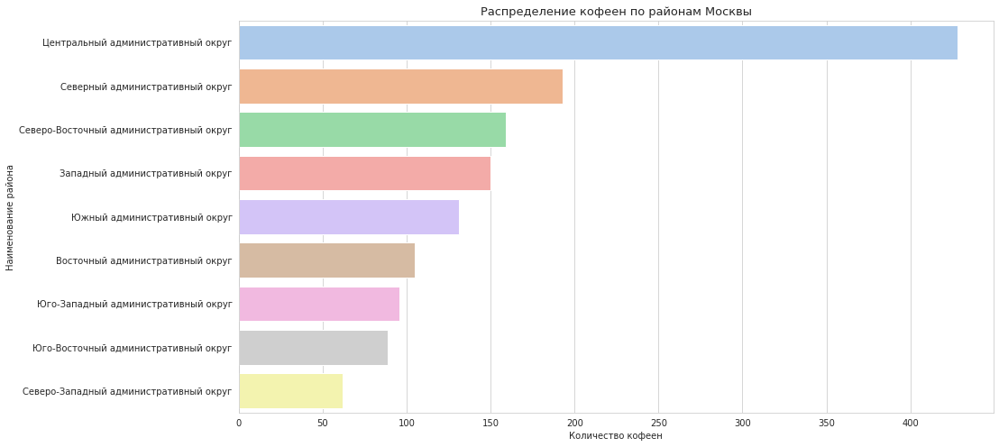

In [56]:
plt.figure(figsize=(15, 8))
sns.barplot(y='district', x='name', data=data_coffee);

plt.title('Распределение кофеен по районам Москвы')
plt.xlabel('Количество кофеен')
plt.ylabel('Наименование района')

plt.show()

По полученным данным, можно сделать вывод. что наибольшее количество кофеен расположено в Центральном АО - более 400, меньше всего кофеен в Северо-западном АО - около 60.

In [57]:
# построим карту Москвы и укажем на ней кофейни
from folium.plugins import MarkerCluster
moscow_lat, moscow_lng = 55.751244, 37.618423
m_cof = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

marker_cluster = MarkerCluster().add_to(m_cof)

def cluster_cof(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        ).add_to(marker_cluster)
    
data.query('category ==  "кофейня"').apply(cluster_cof, axis=1)
m_cof

### Круглосуточные кофейни

Рассмотрим круглосуточные кофейни, представленные в данных.

In [58]:
# сгруппируем кофейни, работающие 24/7, по районам Москвы
data_cof24 = data.query('(category ==  "кофейня")and(is_24_7 == True)').groupby('district', as_index=False)['name'].count().sort_values('name', ascending=False)

data_cof24

,district,name
5,Центральный административный округ,26
1,Западный административный округ,9
7,Юго-Западный административный округ,7
0,Восточный административный округ,5
2,Северный административный округ,5
3,Северо-Восточный административный округ,3
4,Северо-Западный административный округ,2
6,Юго-Восточный административный округ,1
8,Южный административный округ,1


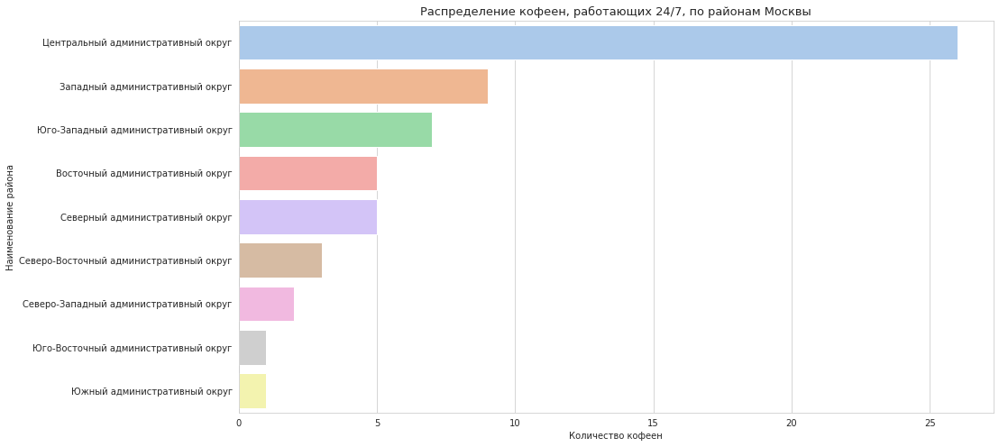

In [59]:
plt.figure(figsize=(15, 8))
sns.barplot(y='district', x='name', data=data_cof24);

plt.title('Распределение кофеен, работающих 24/7, по районам Москвы')
plt.xlabel('Количество кофеен')
plt.ylabel('Наименование района')

plt.show()

Почти половина всех кофеен, работающих 24/7, расположены в Центральном АО. Меньше всего таких заведений в Южном и Юго-Восточном АО.

In [60]:
# построим карту Москвы с указанием круглосуточных кофеен
moscow_lat, moscow_lng = 55.751244, 37.618423
m_cof24 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

marker_cluster = MarkerCluster().add_to(m_cof24)

def cluster_cof24(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        ).add_to(marker_cluster)
    
data.query('(category ==  "кофейня")and(is_24_7 == True)').apply(cluster_cof24, axis=1)
m_cof24

### Рейтинги кофеен в разных районах Москвы

Изучим средние рейтинги кофеен в разрезе административных округов Москвы.

In [61]:
# посчитаем количество и средний рейтинг кофеен в разрезе районов с помощью сводной таблицы
data_cof_rating = data.query('category ==  "кофейня"').pivot_table(index='district', values='rating', aggfunc=['count', 'mean'])
data_cof_rating.columns = ['count', 'rating']

data_cof_rating.sort_values('rating', ascending=False)

,count,rating
district,,
Центральный административный округ,428,4.336449
Северо-Западный административный округ,62,4.325806
Северный административный округ,193,4.291710
Юго-Западный административный округ,96,4.283333
Восточный административный округ,105,4.282857
Южный административный округ,131,4.232824
Юго-Восточный административный округ,89,4.225843
Северо-Восточный административный округ,159,4.216981
Западный административный округ,150,4.195333


In [62]:
# построим фоновую картограмму со средними рейтингами кофеен
state_geo = '/datasets/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423
m_с = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=data_cof_rating,
    columns=[data_cof_rating.index,'rating'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.7,
    legend_name=' Средний рейтинг кофеен по районам Москвы'
).add_to(m_с)

m_с

Усредненные рейтинги кофеен в разрезе административных округов различаются незначительно - в диапазоне от 4.20 до 4.34. Тем не менее, лидерами по величине среднего рейтинга можно назвать Центральный и Северо-западный АО.

### Средние цены в кофейнях Москвы

Рассмотрим средние цены в кофейнях Москвы по районам.

In [63]:
# посчитаем средние цены в кофейнях в разрезе районов с помощью сводной таблицы
data_cof_price = data.query('category ==  "кофейня"').pivot_table(index='district', values='middle_coffee_cup', aggfunc='mean').sort_values('middle_coffee_cup', ascending=False)

data_cof_price

,middle_coffee_cup
district,
Западный административный округ,189.938776
Центральный административный округ,187.518519
Юго-Западный административный округ,184.176471
Восточный административный округ,174.023810
Северный административный округ,165.789474
Северо-Западный административный округ,165.523810
Северо-Восточный административный округ,165.333333
Южный административный округ,158.488372
Юго-Восточный административный округ,151.088235


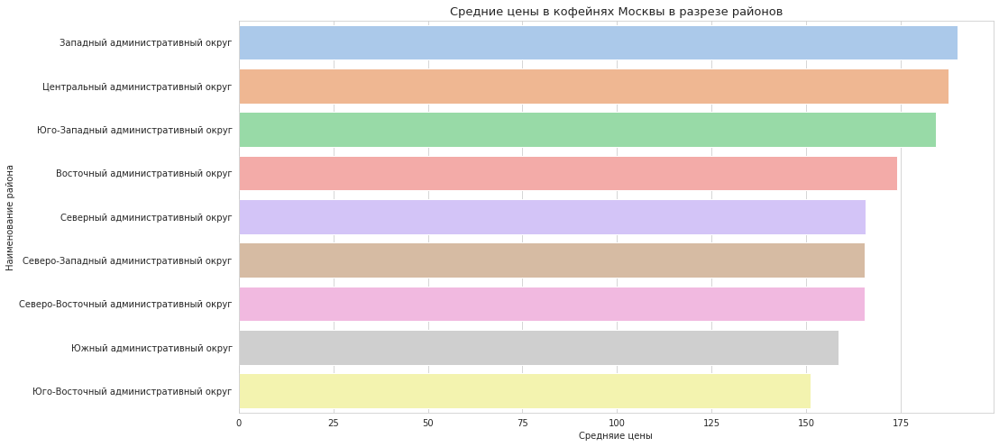

In [64]:
plt.figure(figsize=(15, 8))
sns.barplot(y=data_cof_price.index, x='middle_coffee_cup', data=data_cof_price);

plt.title('Средние цены в кофейнях Москвы в разрезе районов')
plt.xlabel('Средняие цены')
plt.ylabel('Наименование района')

plt.show()

Можно заметить, что в целом средние цены в кофейнях в разных районах, за исключением Западного, Центрального и Юго-Западного АО, отличаются не сильно и варьируются в пределах 150-170 руб. Самая высокая средняя цена составляет 190 руб и наблюдается в Центральном АО.

### Сети кофеен

Рассмотрим соотношение сетевых и несетевых кофеен в разрезе районов Москвы.

In [65]:
# сформируем сводную таблицу, в кот. посчитаем кол-во сетевых и несетевых кофеен в разных районах Москвы
data_cof_ch = data.query('category ==  "кофейня"').pivot_table(index='district',columns='chain', values='name', aggfunc='count')
data_cof_ch.columns = ['Не сетевые','Сетевые']
data_cof_ch = data_cof_ch.sort_values('Не сетевые')

data_cof_ch

,Не сетевые,Сетевые
district,,
Северо-Западный административный округ,28,34
Юго-Западный административный округ,46,50
Восточный административный округ,54,51
Западный административный округ,57,93
Юго-Восточный административный округ,60,29
Южный административный округ,65,66
Северо-Восточный административный округ,79,80
Северный административный округ,96,97
Центральный административный округ,207,221


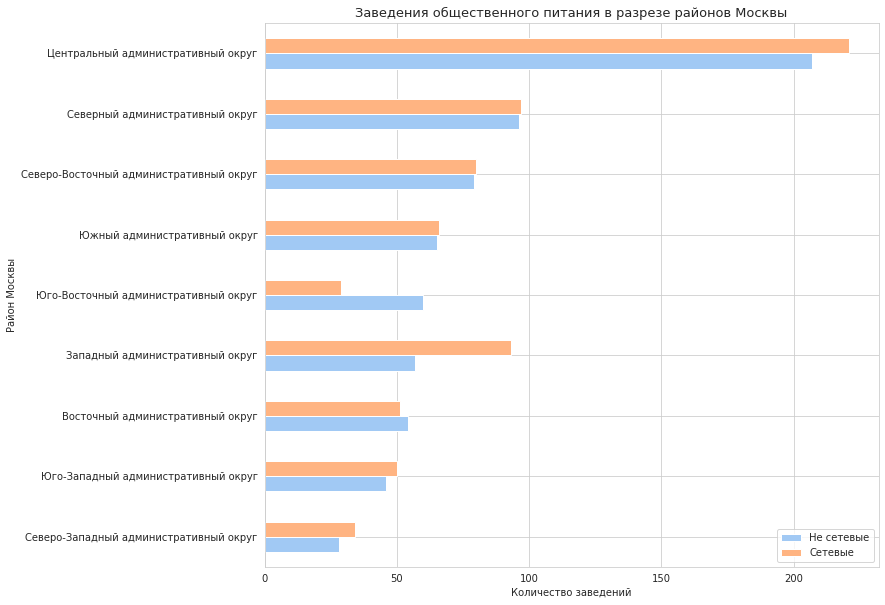

In [66]:
# построим график по полученным данным
data_cof_ch.plot( 
    kind = 'barh',  
    title = 'Заведения общественного питания в разрезе районов Москвы', 
    figsize=(11,10));

plt.xlabel('Количество заведений')
plt.ylabel('Район Москвы')

plt.show()

Исходя из полученных данных, лидером по числу как сетевых, так и не сетевых кофеен является Центральный АО, меньше всего кофеен, как было сказано выше в Северо-западном АО. Соотношение сетевых и несетевых заведений в различных районах Москвы различается, однако можно увидеть,  что в половине районов кол-во сетевых и несетевых кофеен близко друг к другу.

### Вывод

По полученным данным можно сделать вывод, что наибольшее число кофеен наблюдается в Центральном АО, что в целом обуславливается большим потоком людей ежедневно находящихся в центре города по различным причинам - от работы до посещения досуговых центров. Безусловно, размещая кофейню в данном районе, вероятность ее посещения большим числом клиентов значительно выше, чем других районах, например в Северо-западном АО, однако и конкуренция в таком административном округе будет в разы выше. Нужно также заметить, что в Центральном АО больше всего круглосуточных кофеен, тем не менее в целом по Москве их достаточно мало - всего 59 из 1413 кофеен. Серьезных отличий в средних рейтингах заведений такой категории в разрезе районов не наблюдается, как и значительных различий в средних ценах, за исключением Западного, Центрального и Юго-Западного АО. Необходимо так же отметить, что в районах с большим количеством кофеен число сетевых и несетевых кофеен примерно одинаковое.

Исходя из данных наблюдений, можно сказать, что при открытии кофейни в Москве можно ориентироваться на следующий вариант: выбрать район с не слишком высокой конкуренцией, например Северный АО, в котором значительно меньше кофеен, чем в Центральном АО, немного круглосуточных заведений, что даст преимущество при открытии кофейни, работающей 24/7, и при этом достаточно доступные средние цены - около 165 руб, что позволит посещать данную кофейню широкому кругу клиентов. Кроме того, можно ориентировать на соотношение сетевых/несетевых кофеен, предпочитая районы с меньшим числом сетевых заведений